In [1]:
options(jupyter.plot_mimetypes = 'image/png')
options(repr.plot.width = 1, repr.plot.height = 0.75, repr.plot.res = 100)

In [2]:
library(readr)
library(DESeq2)
library(ggplot2)
library(cowplot)


Loading required package: S4Vectors

Loading required package: stats4

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, setdiff, sort, table, tapply,
    union, unique, unsplit, which.max, which.min



Attaching package: ‘S4Vectors’


The follow

Let's start with reading in the 24h samples

In [3]:
SUM159_24h_r1 = read_tsv("../bulk/GSM3763467_SUM159_DMSO_24h_R1.counts.txt.gz", col_names=F)
SUM159_24h_r2 = read_tsv("../bulk/GSM3763468_SUM159_DMSO_24h_R2.counts.txt.gz", col_names=F)

SUM159jq1r_24h_r1 = read_tsv("../bulk/GSM3763477_SUM159_JQ1R_DMSO_24h_R1.counts.txt.gz", col_names=F)
SUM159jq1r_24h_r2 = read_tsv("../bulk/GSM3763478_SUM159_JQ1R_DMSO_24h_R2.counts.txt.gz", col_names=F)

Rows: 23841 Columns: 2

── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (1): X1
dbl (1): X2


ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.

Rows: 23841 Columns: 2

── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (1): X1
dbl (1): X2


ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.

Rows: 23841 Columns: 2

── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (1): X1
dbl (1): X2


ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.

Rows: 23841 Columns: 2

── Column specification ──────────────────────────────────────────────

And continue with the 3h samples:

In [4]:
SUM159_3h_r1 = read_tsv("../bulk/GSM3763469_SUM159_DMSO_3h_R1.counts.txt.gz", col_names=F)
SUM159_3h_r2 = read_tsv("../bulk/GSM3763470_SUM159_DMSO_3h_R2.counts.txt.gz", col_names=F)

SUM159jq1r_3h_r1 = read_tsv("../bulk/GSM3763479_SUM159_JQ1R_DMSO_3h_R1.counts.txt.gz", col_names=F)
SUM159jq1r_3h_r2 = read_tsv("../bulk/GSM3763480_SUM159_JQ1R_DMSO_3h_R2.counts.txt.gz", col_names=F)

Rows: 23841 Columns: 2

── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (1): X1
dbl (1): X2


ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.

Rows: 23841 Columns: 2

── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (1): X1
dbl (1): X2


ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.

Rows: 23841 Columns: 2

── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (1): X1
dbl (1): X2


ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.

Rows: 23841 Columns: 2

── Column specification ──────────────────────────────────────────────

In [5]:
colnames(SUM159_24h_r1) = c("gene", "SUM159_24h_r1")
colnames(SUM159_24h_r2) = c("gene", "SUM159_24h_r2")
colnames(SUM159jq1r_24h_r1) = c("gene", "SUM159jq1r_24h_r1")
colnames(SUM159jq1r_24h_r2) = c("gene", "SUM159jq1r_24h_r2")

In [6]:
colnames(SUM159_3h_r1) = c("gene", "SUM159_3h_r1")
colnames(SUM159_3h_r2) = c("gene", "SUM159_3h_r2")
colnames(SUM159jq1r_3h_r1) = c("gene", "SUM159jq1r_3h_r1")
colnames(SUM159jq1r_3h_r2) = c("gene", "SUM159jq1r_3h_r2")

In [7]:
sum159_24h.expr_df <- merge(SUM159_24h_r1, SUM159_24h_r2, by = 'gene')
sum159jq1r_24h.expr_df <- merge(SUM159jq1r_24h_r1, SUM159jq1r_24h_r2, by = 'gene')

sum159_3h.expr_df <- merge(SUM159_3h_r1, SUM159_3h_r2, by = 'gene')
sum159jq1r_3h.expr_df <- merge(SUM159jq1r_3h_r1, SUM159jq1r_3h_r2, by = 'gene')

In [8]:
head(sum159_24h.expr_df)

,gene,SUM159_24h_r1,SUM159_24h_r2
,<chr>,<dbl>,<dbl>
1,__alignment_not_unique,1946526,4392993
2,__ambiguous,385372,884778
3,__no_feature,2015667,4587061
4,__not_aligned,0,0
5,__too_low_aQual,0,0
6,A1BG,44,214


In [9]:
merge_24h.expr_df <- merge(sum159_24h.expr_df, sum159jq1r_24h.expr_df, by = 'gene')
merge_3h.expr_df <- merge(sum159_3h.expr_df, sum159jq1r_3h.expr_df, by = 'gene')

In [10]:
head(merge_24h.expr_df)

,gene,SUM159_24h_r1,SUM159_24h_r2,SUM159jq1r_24h_r1,SUM159jq1r_24h_r2
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
1,__alignment_not_unique,1946526,4392993,5571795,3575085
2,__ambiguous,385372,884778,815090,514010
3,__no_feature,2015667,4587061,5254348,3574216
4,__not_aligned,0,0,0,0
5,__too_low_aQual,0,0,0,0
6,A1BG,44,214,171,63


In [11]:
expr_df_3h = merge_3h.expr_df[grep("^__", merge_3h.expr_df$gene, invert=T),]
rownames(expr_df_3h) = expr_df_3h$gene
expr_df_3h$gene = NULL


expr_df_24h = merge_24h.expr_df[grep("^__", merge_24h.expr_df$gene, invert=T),]
rownames(expr_df_24h) = expr_df_24h$gene
expr_df_24h$gene = NULL
expr_df_24h

,SUM159_24h_r1,SUM159_24h_r2,SUM159jq1r_24h_r1,SUM159jq1r_24h_r2
,<dbl>,<dbl>,<dbl>,<dbl>
A1BG,44,214,171,63
A1BG-AS1,22,45,69,58
A1CF,2,4,1,0
A2M,4,28,0,0
A2M-AS1,3,2,0,0
A2ML1,11,15,8,8
A2MP1,0,0,0,0
A3GALT2,0,0,1,2
A4GALT,286,1023,545,224


In [12]:
pdat_24h = data.frame( id=c("SUM159_24h_r1","SUM159_24h_r2", "SUM159jq1r_24h_r1","SUM159jq1r_24h_r2"),
                       group=c("SUM159_24h", "SUM159_24h", "SUM159jq1r_24h", "SUM159jq1r_24h") )
pdat_24h

id,group
<chr>,<chr>
SUM159_24h_r1,SUM159_24h
SUM159_24h_r2,SUM159_24h
SUM159jq1r_24h_r1,SUM159jq1r_24h
SUM159jq1r_24h_r2,SUM159jq1r_24h


In [13]:
pdat_3h = data.frame( id=c("SUM159_3h_r1","SUM159_3h_r2", "SUM159jq1r_3h_r1","SUM159jq1r_3h_r2"), group=c("SUM159_3h", "SUM159_3h", "SUM159jq1r_3h", "SUM159jq1r_3h") )
pdat_3h

id,group
<chr>,<chr>
SUM159_3h_r1,SUM159_3h
SUM159_3h_r2,SUM159_3h
SUM159jq1r_3h_r1,SUM159jq1r_3h
SUM159jq1r_3h_r2,SUM159jq1r_3h


# DESeq2 analysis for 24h

In [14]:
dds_24h <- DESeqDataSetFromMatrix(countData=expr_df_24h, 
                                  colData=pdat_24h,
                                  design=~group, tidy = FALSE)

converting counts to integer mode

Warning message in DESeqDataSet(se, design = design, ignoreRank):
“some variables in design formula are characters, converting to factors”


In [15]:
dds_24h

class: DESeqDataSet 
dim: 23836 4 
metadata(1): version
assays(1): counts
rownames(23836): A1BG A1BG-AS1 ... ZZEF1 ZZZ3
rowData names(0):
colnames(4): SUM159_24h_r1 SUM159_24h_r2 SUM159jq1r_24h_r1
  SUM159jq1r_24h_r2
colData names(2): id group

In [16]:
dds_24h <- DESeq(dds_24h)
res_lfc_24h <- lfcShrink(dds_24h, coef=resultsNames(dds_24h)[[2]], type="apeglm")
res_lfc_24h <- res_lfc_24h[order(res_lfc_24h$padj, decreasing=FALSE),]


res_24h <- results(dds_24h)
res_24h <- res_24h[order(res_24h$padj, decreasing=FALSE),]


estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

using 'apeglm' for LFC shrinkage. If used in published research, please cite:
    Zhu, A., Ibrahim, J.G., Love, M.I. (2018) Heavy-tailed prior distributions for
    sequence count data: removing the noise and preserving large differences.
    Bioinformatics. https://doi.org/10.1093/bioinformatics/bty895



In [17]:
res_24h

log2 fold change (MLE): group SUM159jq1r 24h vs SUM159 24h 
Wald test p-value: group SUM159jq1r 24h vs SUM159 24h 
DataFrame with 23836 rows and 6 columns
         baseMean log2FoldChange     lfcSE      stat       pvalue         padj
        <numeric>      <numeric> <numeric> <numeric>    <numeric>    <numeric>
COL3A1    8131.01       -8.00165 0.1552731  -51.5327  0.00000e+00  0.00000e+00
DIO2      3896.70       -7.25477 0.1680323  -43.1749  0.00000e+00  0.00000e+00
MMP1      4982.18        4.01058 0.0986438   40.6572  0.00000e+00  0.00000e+00
PLAT     17486.06        2.83813 0.0772845   36.7232 3.11505e-295 1.29649e-291
SLC37A2   3024.95        3.91287 0.1128101   34.6855 1.30472e-263 4.34421e-260
...           ...            ...       ...       ...          ...          ...
ZSCAN10  0.178396      -1.566674   4.96784 -0.315363     0.752486           NA
ZSCAN18  0.362604       1.881631   4.91811  0.382592     0.702022           NA
ZSCAN4   0.541000       0.589261   4.88797  0.120553   

In [18]:
res_lfc_24h

log2 fold change (MAP): group SUM159jq1r 24h vs SUM159 24h 
Wald test p-value: group SUM159jq1r 24h vs SUM159 24h 
DataFrame with 23836 rows and 5 columns
         baseMean log2FoldChange     lfcSE       pvalue         padj
        <numeric>      <numeric> <numeric>    <numeric>    <numeric>
COL3A1    8131.01       -7.99743 0.1555700  0.00000e+00  0.00000e+00
DIO2      3896.70       -7.24687 0.1677606  0.00000e+00  0.00000e+00
MMP1      4982.18        4.00578 0.0988080  0.00000e+00  0.00000e+00
PLAT     17486.06        2.83164 0.0773378 3.11505e-295 1.29649e-291
SLC37A2   3024.95        3.90663 0.1127897 1.30472e-263 4.34421e-260
...           ...            ...       ...          ...          ...
ZSCAN10  0.178396     -0.0560778  0.767763     0.752486           NA
ZSCAN18  0.362604      0.0611861  0.768540     0.702022           NA
ZSCAN4   0.541000      0.0211329  0.760239     0.904045           NA
ZSCAN5B  0.178396     -0.0560778  0.767763     0.752486           NA
ZSWIM2   0.178396

In [19]:
options(jupyter.plot_mimetypes = 'image/png')
options(repr.plot.width = 15, repr.plot.height = 10, repr.plot.res = 150)

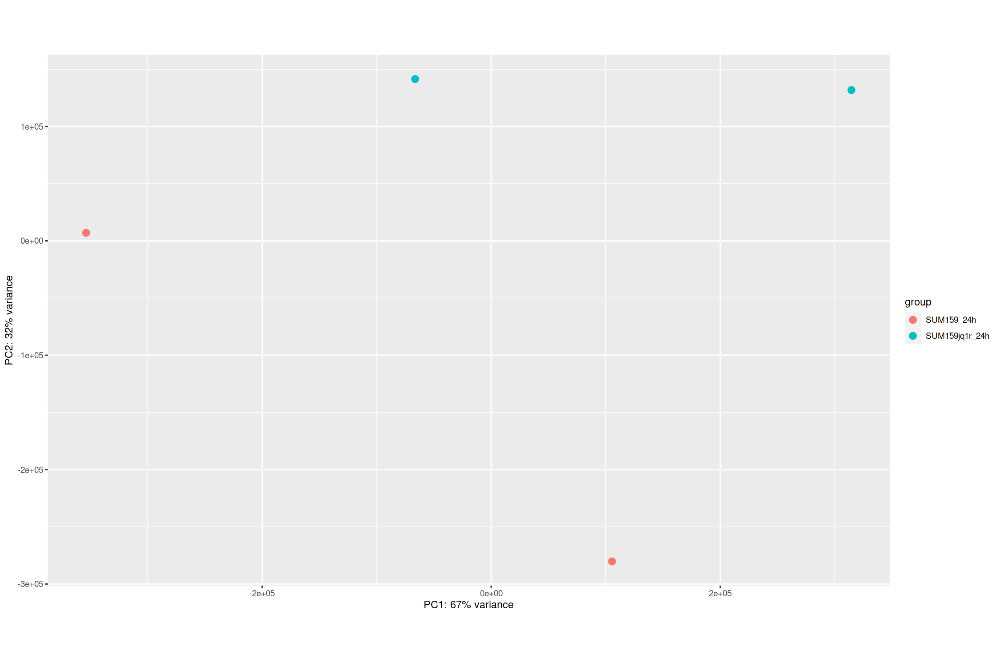

In [75]:
plotPCA( DESeqTransform( dds_24h ), intgroup="group" )

In [66]:
head(dispersions(dds_24h))

[1] 0.1027361 0.1056367 2.5449670 1.0273327 3.8215099 0.4220756

In [68]:
sizeFactors(dds_24h)

SUM159_24h_r1     SUM159_24h_r2 SUM159jq1r_24h_r1 SUM159jq1r_24h_r2 
        0.5941059         1.4013804         1.3789133         0.8831118

In [69]:
dispersionFunction(dds_24h)

function (q) 
coefs[1] + coefs[2]/q
<bytecode: 0x555e2f16e870>
<environment: 0x555e2f16eec8>
attr(,"coefficients")
 asymptDisp   extraPois 
0.003646066 7.002963994 
attr(,"fitType")
[1] "parametric"
attr(,"varLogDispEsts")
[1] 0.9874878
attr(,"dispPriorVar")
[1] 0.5605606

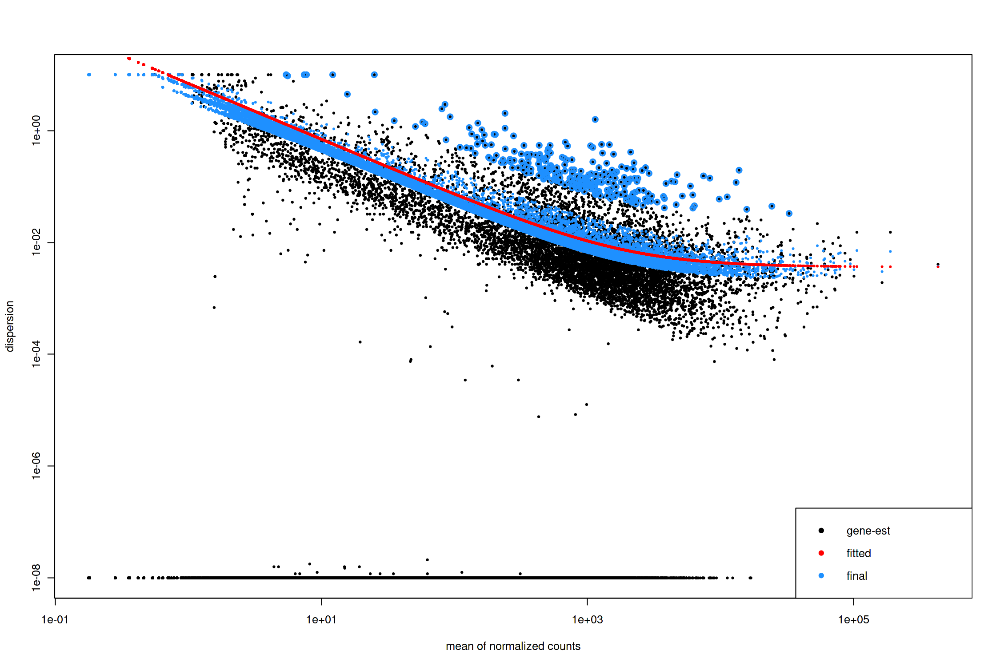

In [20]:
plotDispEsts(dds_24h)


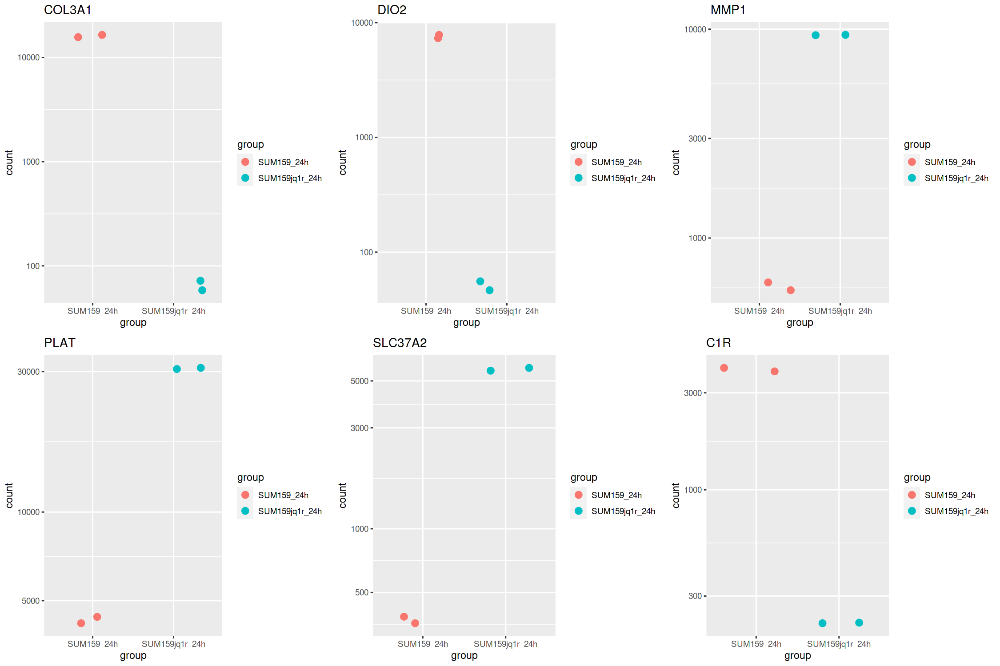

In [21]:
allplots = list()

for (geneName in rownames(head(res_lfc_24h, n=6)))
{
    data = plotCounts(dds_24h, gene=geneName, intgroup="group",returnData = TRUE)

    p = ggplot(data, aes(x=group, y=count, color=group)) + 
  geom_jitter(size=3) + ggtitle(geneName)+
  scale_y_log10()

  allplots[[geneName]] = p
}

cowplot::plot_grid(plotlist= allplots)

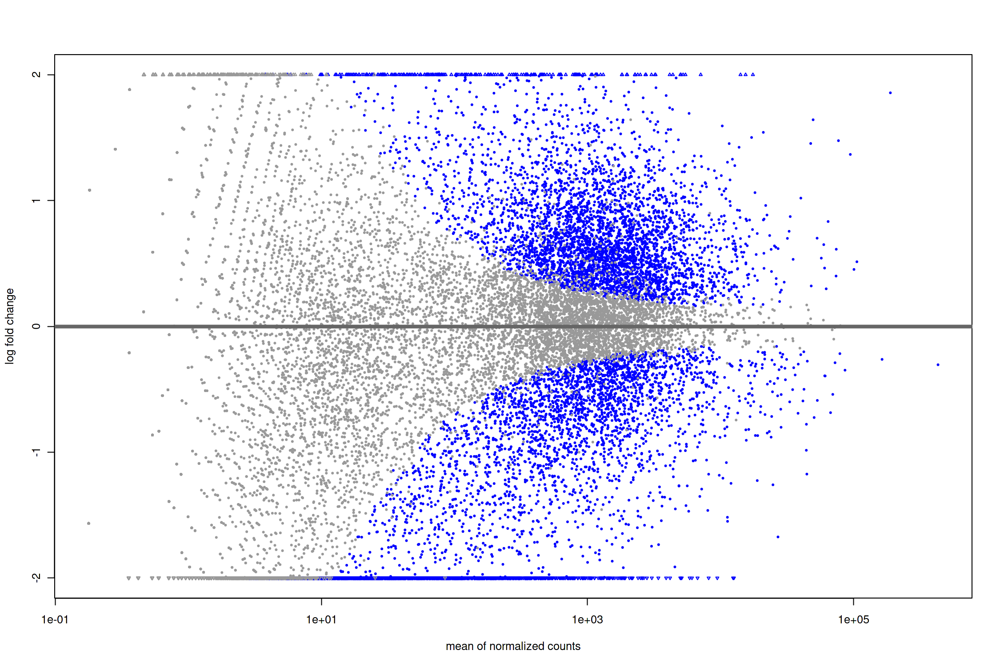

In [22]:
plotMA(res_24h, ylim=c(-2,2))


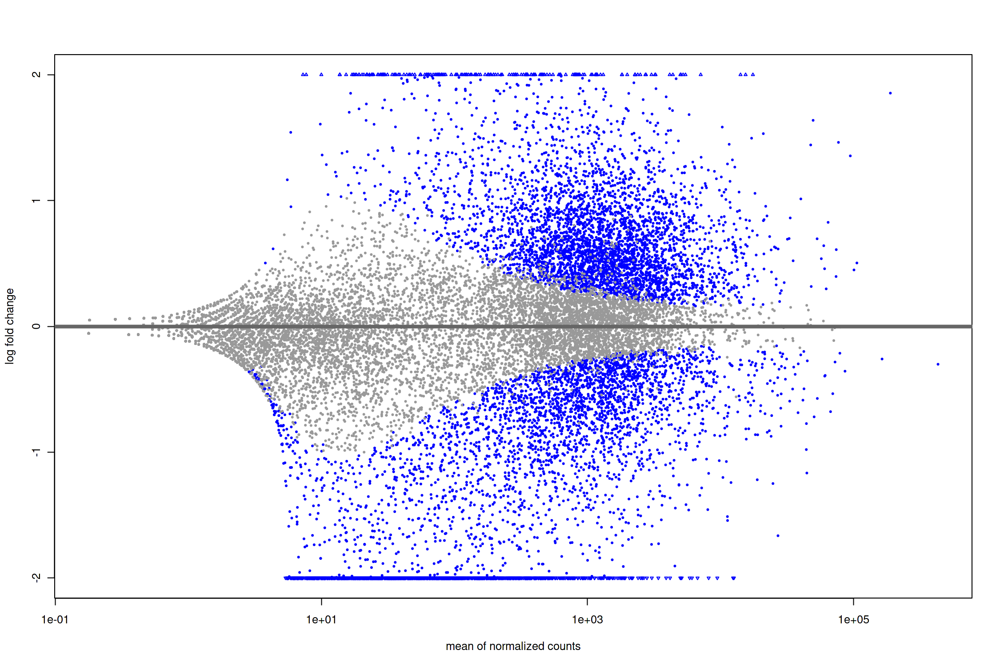

In [23]:
plotMA(res_lfc_24h, ylim=c(-2,2))

In [24]:
resultsNames(dds_24h)

[1] "Intercept"                          "group_SUM159jq1r_24h_vs_SUM159_24h"

In [25]:
resLFC_24h <- lfcShrink(dds_24h, coef="group_SUM159jq1r_24h_vs_SUM159_24h", type="apeglm")
resNorm_24h <- lfcShrink(dds_24h, coef="group_SUM159jq1r_24h_vs_SUM159_24h", type="normal")
resAsh_24h <- lfcShrink(dds_24h, coef="group_SUM159jq1r_24h_vs_SUM159_24h", type="ashr")


using 'apeglm' for LFC shrinkage. If used in published research, please cite:
    Zhu, A., Ibrahim, J.G., Love, M.I. (2018) Heavy-tailed prior distributions for
    sequence count data: removing the noise and preserving large differences.
    Bioinformatics. https://doi.org/10.1093/bioinformatics/bty895

using 'normal' for LFC shrinkage, the Normal prior from Love et al (2014).

Note that type='apeglm' and type='ashr' have shown to have less bias than type='normal'.
See ?lfcShrink for more details on shrinkage type, and the DESeq2 vignette.
Reference: https://doi.org/10.1093/bioinformatics/bty895

using 'ashr' for LFC shrinkage. If used in published research, please cite:
    Stephens, M. (2016) False discovery rates: a new deal. Biostatistics, 18:2.
    https://doi.org/10.1093/biostatistics/kxw041



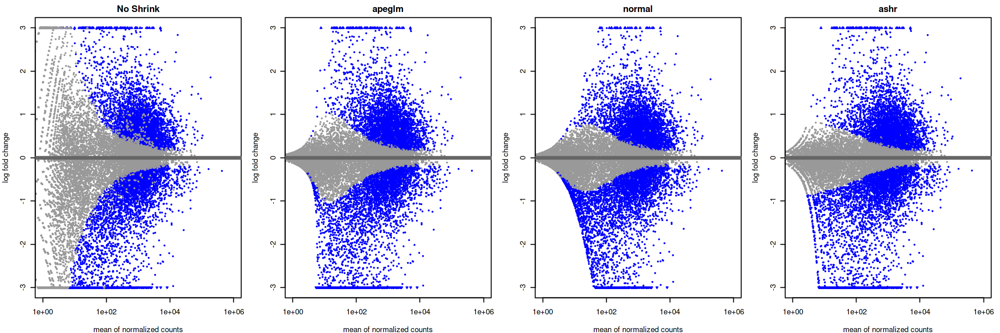

In [26]:
options(repr.plot.width = 15, repr.plot.height = 5, repr.plot.res = 150)

pltXLim = 10 ** ceiling(log10(max(counts(dds_24h, normalized=T))))
par(mfrow=c(1,4), mar=c(4,4,2,1))
xlim <- c(1,pltXLim); ylim <- c(-3,3)
plotMA(res_24h, xlim=xlim, ylim=ylim, main="No Shrink")
plotMA(resLFC_24h, xlim=xlim, ylim=ylim, main="apeglm")
plotMA(resNorm_24h, xlim=xlim, ylim=ylim, main="normal")
plotMA(resAsh_24h, xlim=xlim, ylim=ylim, main="ashr")

options(repr.plot.width = 15, repr.plot.height = 10, repr.plot.res = 150)

In [27]:
outres_24h = res_lfc_24h[! is.na(res_lfc_24h$padj),]

#fetches normalized counts
normExpr_24h = counts(dds_24h, normalized=T)
cn_24h = colnames(normExpr_24h)
normExpr2_24h = cbind(rownames(normExpr_24h), normExpr_24h)
colnames(normExpr2_24h) = c("Geneid", cn_24h)

finalres_24h = data.frame(PROBEID=rownames(outres_24h), FC=outres_24h$log2FoldChange, PVAL=outres_24h$pvalue, ADJ.PVAL=outres_24h$padj)

write.table(finalres_24h, file="../bulk/24h_sum159_vs_sum159_jq1r.tsv", row.names=F, quote=F, sep="\t")
write.table(normExpr2_24h, file="../bulk/normed_expr.24h_sum159_vs_sum159_jq1r.tsv", row.names=F, quote=F, sep="\t")

printres_24h = finalres_24h[finalres_24h$ADJ.PVAL < 0.001, ]
write.table(printres_24h, file="../bulk/sig.24h_sum159_vs_sum159_jq1r.tsv", row.names=F, quote=F, sep="\t")

printres_24h.up = printres_24h[printres_24h$FC > 1, ]
write.table(printres_24h.up , file="../bulk/sig.up.24h_sum159_vs_sum159_jq1r.tsv", row.names=F, quote=F, sep="\t")

printres_24h.down = printres_24h[printres_24h$FC < -1, ]
write.table(printres_24h.down , file="../bulk/sig.down.24h_sum159_vs_sum159_jq1r.tsv", row.names=F, quote=F, sep="\t")



In [28]:
top24h.de = finalres_24h[order(abs(finalres_24h$FC),decreasing=TRUE),]
top24h.de = top24h.de[top24h.de$ADJ.PVAL < 0.05, ]

top24h.de.500.down = head(top24h.de[top24h.de$FC < -1,], n=500)
top24h.de.500.up = head(top24h.de[top24h.de$FC > 1,], n=500)

write.table(top24h.de.500.down , file="../bulk/top.down.24h_sum159_vs_sum159_jq1r.tsv", row.names=F, quote=F, sep="\t")
write.table(top24h.de.500.up , file="../bulk/top.up.24h_sum159_vs_sum159_jq1r.tsv", row.names=F, quote=F, sep="\t")

write.table(top24h.de , file="../bulk/top.all.24h_sum159_vs_sum159_jq1r.tsv", row.names=F, quote=F, sep="\t")


In [29]:
top24h.de

,PROBEID,FC,PVAL,ADJ.PVAL
,<chr>,<dbl>,<dbl>,<dbl>
SERPINB4,SERPINB4,-14.645039,2.796709e-21,5.333289e-20
POSTN,POSTN,-12.274496,2.231546e-15,2.731675e-14
AGR2,AGR2,-12.085943,5.990177e-15,7.092778e-14
NFATC4,NFATC4,-11.842433,2.163980e-14,2.459108e-13
SSX1,SSX1,-11.784287,2.702327e-14,3.050057e-13
SULT1B1,SULT1B1,-11.498186,8.104968e-18,1.230005e-16
RGS7BP,RGS7BP,-11.450216,1.639681e-13,1.740906e-12
SERPINB3,SERPINB3,-10.947858,1.310642e-39,6.324513e-38
BPIFA2,BPIFA2,-10.902006,2.213928e-12,2.091798e-11


In [30]:
library(ggrepel)
library(EnhancedVolcano)


Registered S3 methods overwritten by 'ggalt':
  method                  from   
  grid.draw.absoluteGrob  ggplot2
  grobHeight.absoluteGrob ggplot2
  grobWidth.absoluteGrob  ggplot2
  grobX.absoluteGrob      ggplot2
  grobY.absoluteGrob      ggplot2



In [31]:
head(outres_24h)

log2 fold change (MAP): group SUM159jq1r 24h vs SUM159 24h 
Wald test p-value: group SUM159jq1r 24h vs SUM159 24h 
DataFrame with 6 rows and 5 columns
         baseMean log2FoldChange     lfcSE       pvalue         padj
        <numeric>      <numeric> <numeric>    <numeric>    <numeric>
COL3A1    8131.01       -7.99743 0.1555700  0.00000e+00  0.00000e+00
DIO2      3896.70       -7.24687 0.1677606  0.00000e+00  0.00000e+00
MMP1      4982.18        4.00578 0.0988080  0.00000e+00  0.00000e+00
PLAT     17486.06        2.83164 0.0773378 3.11505e-295 1.29649e-291
SLC37A2   3024.95        3.90663 0.1127897 1.30472e-263 4.34421e-260
C1R       2063.05       -4.13640 0.1213527 9.90267e-256 2.74766e-252

Warning message:
“One or more p-values is 0. Converting to 10^-1 * current lowest non-zero p-value...”


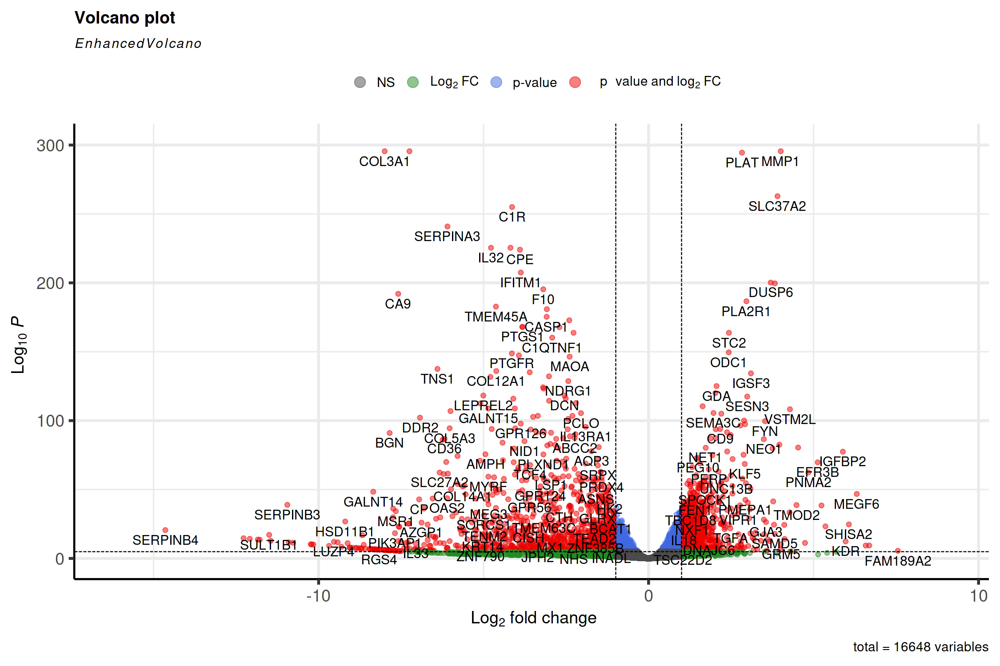

In [32]:
EnhancedVolcano(outres_24h,
    lab = rownames(outres_24h),
    x = 'log2FoldChange',
    y = 'pvalue')

In [82]:
library(pheatmap)
library(RColorBrewer)

In [98]:
pdat_24h

id,group
<chr>,<chr>
SUM159_24h_r1,SUM159_24h
SUM159_24h_r2,SUM159_24h
SUM159jq1r_24h_r1,SUM159jq1r_24h
SUM159jq1r_24h_r2,SUM159jq1r_24h


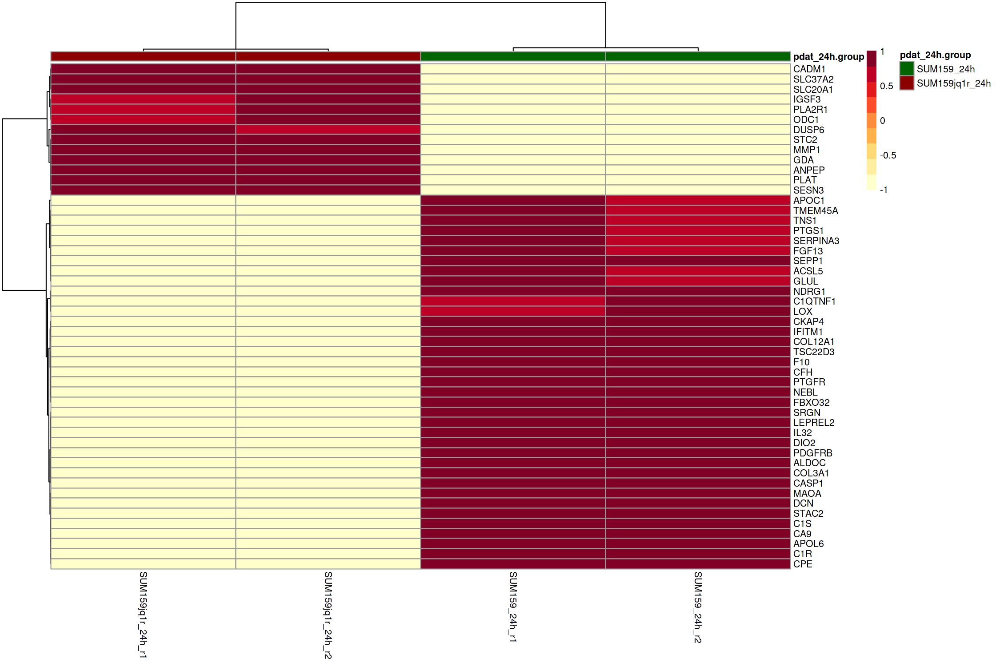

In [118]:
sigExprData = normExpr_24h[head(rownames(outres_24h), n=50), ]

heat_colors <- brewer.pal(9, "YlOrRd")

annotation <- data.frame(pdat_24h$group)
rownames(annotation) = pdat_24h$id

grpColors <- c("darkgreen", "darkred")
names(grpColors) <- c("SUM159_24h", "SUM159jq1r_24h")
anno_colors <- list("pdat_24h.group" = grpColors)

pheatmap(sigExprData,
        color = heat_colors,
        cluster_rows = T,
        show_rownames = T,
        scale = "row", annotation=annotation, annotation_colors = anno_colors
        )

## 3h Analysis

In [33]:
dds_3h <- DESeqDataSetFromMatrix(countData=expr_df_3h, 
                                  colData=pdat_3h,
                                  design=~group, tidy = FALSE)

dds_3h

converting counts to integer mode

Warning message in DESeqDataSet(se, design = design, ignoreRank):
“some variables in design formula are characters, converting to factors”


class: DESeqDataSet 
dim: 23836 4 
metadata(1): version
assays(1): counts
rownames(23836): A1BG A1BG-AS1 ... ZZEF1 ZZZ3
rowData names(0):
colnames(4): SUM159_3h_r1 SUM159_3h_r2 SUM159jq1r_3h_r1
  SUM159jq1r_3h_r2
colData names(2): id group

In [34]:
dds_3h <- DESeq(dds_3h)
res_lfc_3h <- lfcShrink(dds_3h, coef=resultsNames(dds_3h)[[2]], type="apeglm")
res_lfc_3h <- res_lfc_3h[order(res_lfc_3h$padj, decreasing=FALSE),]


res_3h <- results(dds_3h)
res_3h <- res_3h[order(res_3h$padj, decreasing=FALSE),]


estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

using 'apeglm' for LFC shrinkage. If used in published research, please cite:
    Zhu, A., Ibrahim, J.G., Love, M.I. (2018) Heavy-tailed prior distributions for
    sequence count data: removing the noise and preserving large differences.
    Bioinformatics. https://doi.org/10.1093/bioinformatics/bty895



In [35]:
res_3h

log2 fold change (MLE): group SUM159jq1r 3h vs SUM159 3h 
Wald test p-value: group SUM159jq1r 3h vs SUM159 3h 
DataFrame with 23836 rows and 6 columns
         baseMean log2FoldChange     lfcSE       stat       pvalue         padj
        <numeric>      <numeric> <numeric>  <numeric>    <numeric>    <numeric>
CDH11     2338.85       -5.26163  0.183991   -28.5972 7.27813e-180 1.17338e-175
DIO2      5334.88       -5.71042  0.204730   -27.8925 3.29089e-171 2.65279e-167
COL3A1    4869.73      -10.05965  0.365828   -27.4983 1.83807e-166 9.87780e-163
SLC37A2   6313.28        4.53398  0.165887    27.3317 1.78210e-164 7.18274e-161
IL32      1756.88       -5.43247  0.207005   -26.2432 8.55311e-152 2.75786e-148
...           ...            ...       ...        ...          ...          ...
ZSCAN10  0.407990      -0.143874   4.96935 -0.0289523     0.976903           NA
ZSCAN18  0.000000             NA        NA         NA           NA           NA
ZSCAN4   0.990988      -0.363648   3.24636 -0.112

In [36]:
res_lfc_3h

log2 fold change (MAP): group SUM159jq1r 3h vs SUM159 3h 
Wald test p-value: group SUM159jq1r 3h vs SUM159 3h 
DataFrame with 23836 rows and 5 columns
         baseMean log2FoldChange     lfcSE       pvalue         padj
        <numeric>      <numeric> <numeric>    <numeric>    <numeric>
CDH11     2338.85       -5.24869  0.184108 7.27813e-180 1.17338e-175
DIO2      5334.88       -5.69508  0.205028 3.29089e-171 2.65279e-167
COL3A1    4869.73      -10.03191  0.363574 1.83807e-166 9.87780e-163
SLC37A2   6313.28        4.52275  0.166020 1.78210e-164 7.18274e-161
IL32      1756.88       -5.41683  0.207129 8.55311e-152 2.75786e-148
...           ...            ...       ...          ...          ...
ZSCAN10  0.407990    0.000271223  0.755236     0.976903           NA
ZSCAN18  0.000000             NA        NA           NA           NA
ZSCAN4   0.990988   -0.019026350  0.744122     0.910810           NA
ZSCAN5B  1.149279   -0.109149478  0.756700     0.522789           NA
ZSWIM2   0.000000    

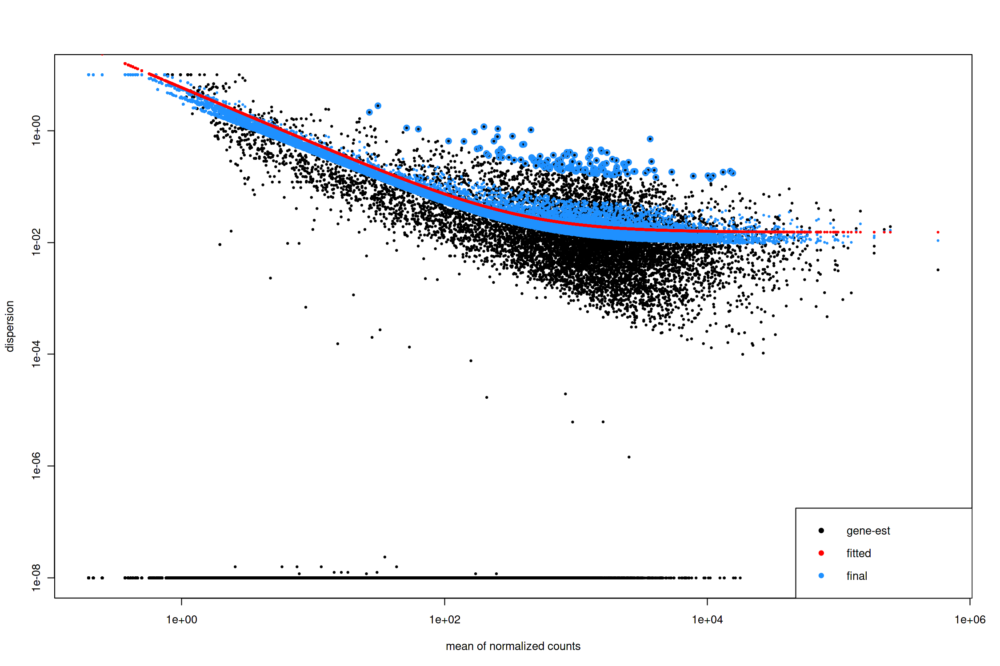

In [37]:
plotDispEsts(dds_3h)

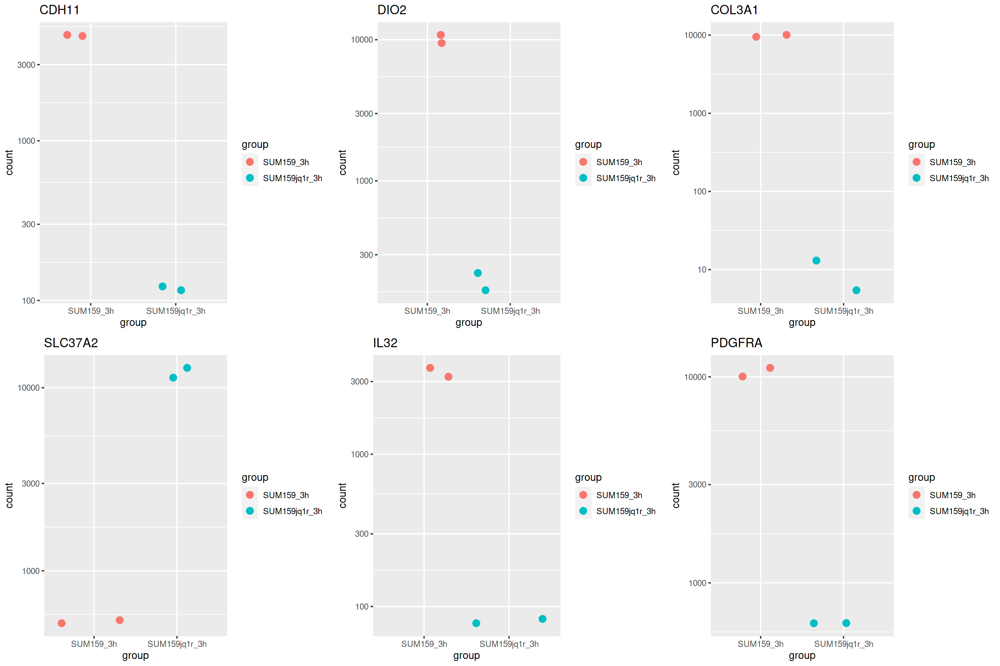

In [38]:
allplots = list()

for (geneName in rownames(head(res_lfc_3h, n=6)))
{
    data = plotCounts(dds_3h, gene=geneName, intgroup="group",returnData = TRUE)

    p = ggplot(data, aes(x=group, y=count, color=group)) + 
    geom_jitter(size=3) + ggtitle(geneName)+
    scale_y_log10()

    allplots[[geneName]] = p
}

cowplot::plot_grid(plotlist= allplots)


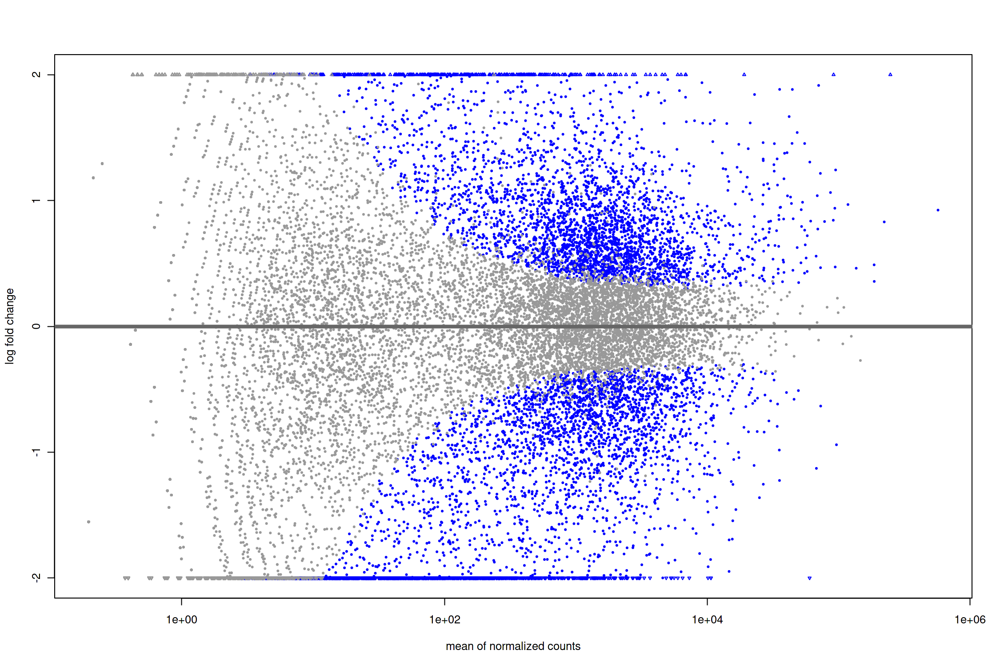

In [39]:
plotMA(res_3h, ylim=c(-2,2))

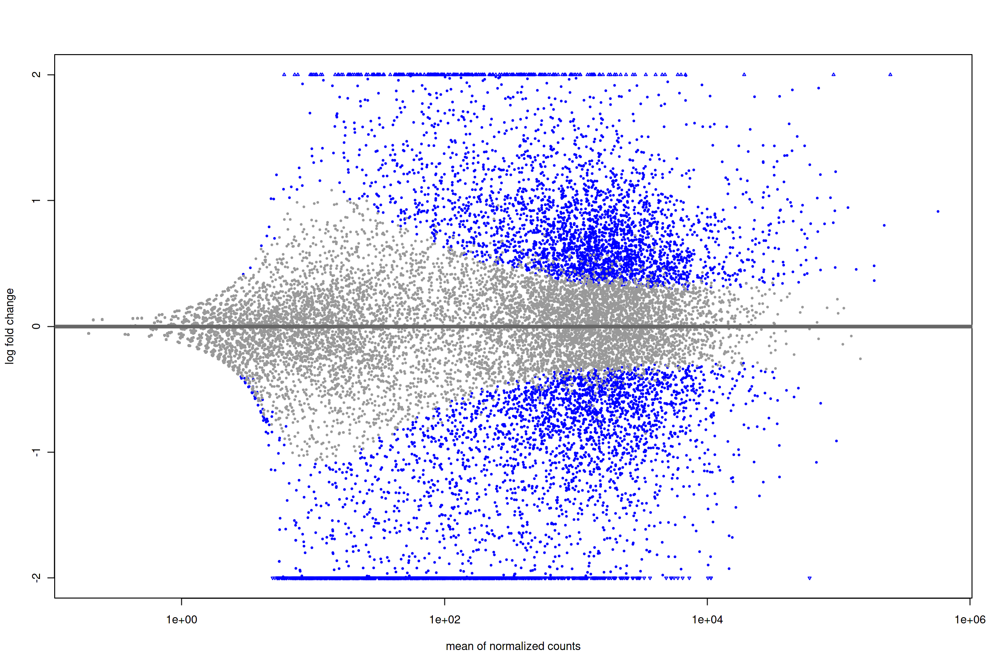

In [40]:
plotMA(res_lfc_3h, ylim=c(-2,2))

In [41]:
resLFC_3h <- lfcShrink(dds_3h, coef="group_SUM159jq1r_3h_vs_SUM159_3h", type="apeglm")
resNorm_3h <- lfcShrink(dds_3h, coef="group_SUM159jq1r_3h_vs_SUM159_3h", type="normal")
resAsh_3h <- lfcShrink(dds_3h, coef="group_SUM159jq1r_3h_vs_SUM159_3h", type="ashr")


using 'apeglm' for LFC shrinkage. If used in published research, please cite:
    Zhu, A., Ibrahim, J.G., Love, M.I. (2018) Heavy-tailed prior distributions for
    sequence count data: removing the noise and preserving large differences.
    Bioinformatics. https://doi.org/10.1093/bioinformatics/bty895

using 'normal' for LFC shrinkage, the Normal prior from Love et al (2014).

Note that type='apeglm' and type='ashr' have shown to have less bias than type='normal'.
See ?lfcShrink for more details on shrinkage type, and the DESeq2 vignette.
Reference: https://doi.org/10.1093/bioinformatics/bty895

using 'ashr' for LFC shrinkage. If used in published research, please cite:
    Stephens, M. (2016) False discovery rates: a new deal. Biostatistics, 18:2.
    https://doi.org/10.1093/biostatistics/kxw041



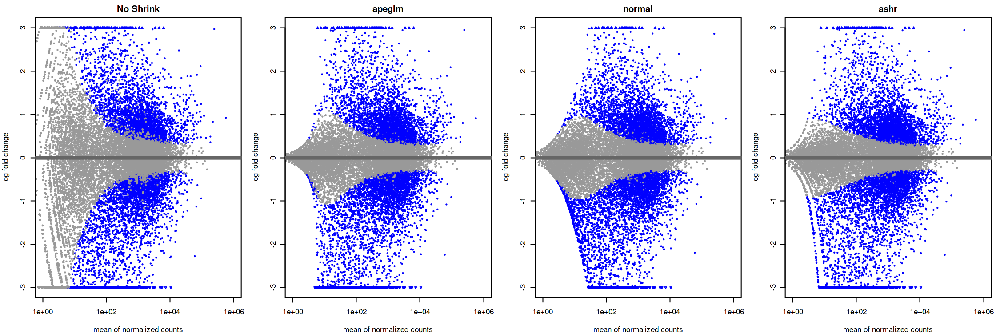

In [42]:
options(repr.plot.width = 15, repr.plot.height = 5, repr.plot.res = 150)

pltXLim = 10 ** ceiling(log10(max(counts(dds_24h, normalized=T))))
par(mfrow=c(1,4), mar=c(4,4,2,1))
xlim <- c(1,pltXLim); ylim <- c(-3,3)
plotMA(res_3h, xlim=xlim, ylim=ylim, main="No Shrink")
plotMA(resLFC_3h, xlim=xlim, ylim=ylim, main="apeglm")
plotMA(resNorm_3h, xlim=xlim, ylim=ylim, main="normal")
plotMA(resAsh_3h, xlim=xlim, ylim=ylim, main="ashr")

options(repr.plot.width = 15, repr.plot.height = 10, repr.plot.res = 150)

In [43]:

outres_3h = res_lfc_3h[! is.na(res_lfc_3h$padj),]

normExpr_3h = counts(dds_3h, normalized=T)
cn_3h = colnames(normExpr_3h)
normExpr2_3h = cbind(rownames(normExpr_3h), normExpr_3h)
colnames(normExpr2_3h) = c("Geneid", cn_3h)

finalres_3h = data.frame(PROBEID=rownames(outres_3h), FC=outres_3h$log2FoldChange, PVAL=outres_3h$pvalue, ADJ.PVAL=outres_3h$padj)

write.table(finalres_3h, file="../bulk/3h_sum159_vs_sum159_jq1r.tsv", row.names=F, quote=F, sep="\t")
write.table(normExpr2_3h, file="../bulk/normed_expr.3h_sum159_vs_sum159_jq1r.tsv", row.names=F, quote=F, sep="\t")

printres_3h = finalres_3h[finalres_3h$ADJ.PVAL < 0.001, ]
write.table(printres_3h, file="../bulk/sig.3h_sum159_vs_sum159_jq1r.tsv", row.names=F, quote=F, sep="\t")

printres_3h.up = printres_3h[printres_3h$FC > 1, ]
write.table(printres_3h.up , file="../bulk/sig.up.3h_sum159_vs_sum159_jq1r.tsv", row.names=F, quote=F, sep="\t")

printres_3h.down = printres_3h[printres_3h$FC < -1, ]
write.table(printres_3h.down , file="../bulk/sig.down.3h_sum159_vs_sum159_jq1r.tsv", row.names=F, quote=F, sep="\t")


In [44]:
top3h.de = printres_3h[order(abs(printres_3h$FC),decreasing=TRUE),]
top3h.de = top3h.de[top3h.de$padj < 0.05, ]


top3h.de.500.down = head(top3h.de[top3h.de$FC < -1,], n=500)
top3h.de.500.up = head(top3h.de[top3h.de$FC > 1,], n=500)

write.table(top3h.de.500.down , file="../bulk/top.down.3h_sum159_vs_sum159_jq1r.tsv", row.names=F, quote=F, sep="\t")
write.table(top3h.de.500.up , file="../bulk/top.up.3h_sum159_vs_sum159_jq1r.tsv", row.names=F, quote=F, sep="\t")


write.table(top3h.de , file="../bulk/top.all.3h_sum159_vs_sum159_jq1r.tsv", row.names=F, quote=F, sep="\t")


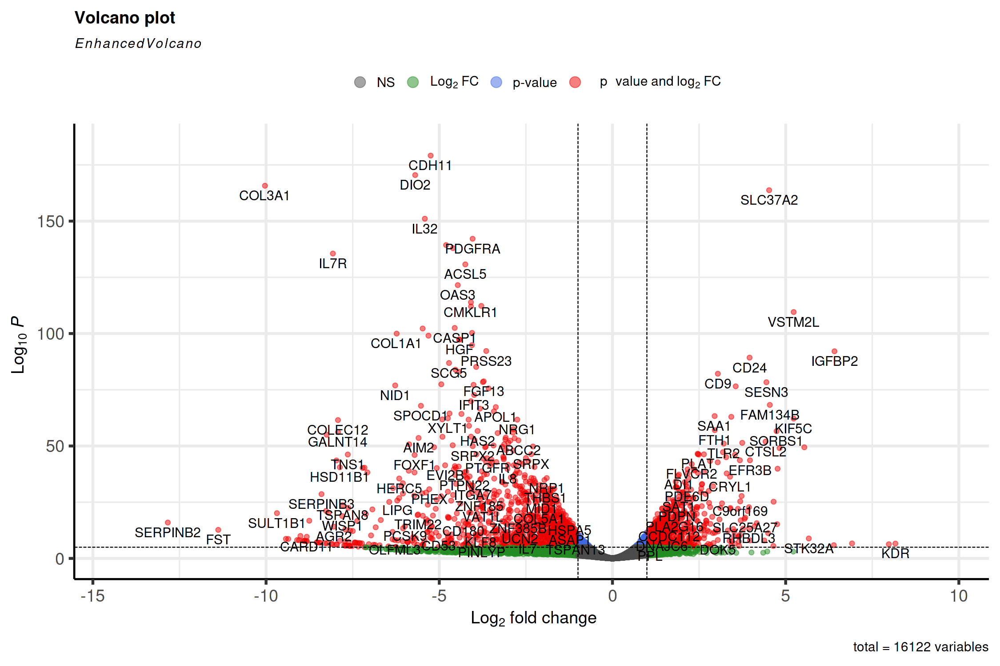

In [45]:
EnhancedVolcano(outres_3h,
    lab = rownames(outres_3h),
    x = 'log2FoldChange',
    y = 'pvalue')

In [46]:
library(disgenet2r)

Sys.setenv(DISGENET_API_KEY= get_disgenet_api_key(email="joppich@bio.ifi.lmu.de", password="disgenetpassword"))

In [47]:
length(intersect(c("AREG","CCND1","BCL2","KLF5","CHKA","EPHB2","EREG","FYN","GLI2","GSN","FOXA1","CXCL8","KDR","MAPT","MMP1","RAB27B","SLC20A1","TRPM2","FOSL1","STC2","MAP4K4","ADAMTS2","SEMA4D","TRIM29","SGK3","PAG1","LGR6","UBASH3B","DNER","E2F7","CD24"),
head(top24h.de.500.up$PROBEID	, n=500)))

[1] 28

In [48]:
input_genes = head(top24h.de.500.up$PROBEID, n=500)

print(input_genes)

disgenet_input <- gene2disease( gene = input_genes, vocabulary = "HGNC", database = "ALL")

common_genes = intersect(disgenet_input@qresult$gene_symbol, input_genes)

print(paste("Remaining Gene Count: ", length(common_genes), "of", length(input_genes)))

res_enrich <-disease_enrichment( entities =common_genes, vocabulary = "HGNC", database = "ALL")

  [1] "FAM189A2"     "FABP4"        "PKNOX2"       "MEGF6"        "SHISA2"      
  [6] "KDR"          "IGFBP2"       "TTC9"         "TSPAN12"      "ZSWIM5"      
 [11] "GAREM"        "SLC35F4"      "EFR3B"        "PNMA2"        "LGR6"        
 [16] "KIF5C"        "TMOD2"        "KCNK13"       "PGBD5"        "VSTM2L"      
 [21] "NR2F1"        "SNAP25"       "TNFRSF21"     "GRM5"         "MMP1"        
 [26] "APBA1"        "IGF2BP3"      "SLC37A2"      "MIR146A"      "SAMD5"       
 [31] "CADM1"        "CHGB"         "CTSL2"        "EGR1"         "DUSP6"       
 [36] "CXCL1"        "TMEM47"       "RHBDL3"       "GJA3"         "FYN"         
 [41] "BEST2"        "GLI2"         "TRIM36"       "NEO1"         "FAM184A"     
 [46] "LZTS1"        "MARK1"        "TLE4"         "C14orf37"     "KCNS3"       
 [51] "IGSF3"        "SCN9A"        "PRKG1"        "LOC646329"    "SORBS1"      
 [56] "ARHGAP44"     "DHRS2"        "FAM134B"      "SESN3"        "PLA2R1"      
 [61] "PLXNA2"       "PMEPA1

Warning message in gene2disease(gene = input_genes, vocabulary = "HGNC", database = "ALL"):
“
 One or more of the genes in the list is not in DisGeNET ( 'ALL' ):
   - GAREM
   - CTSL2
   - C14orf37
   - LOC646329
   - FAM134B
   - LOC100499484
   - MARC1
   - LINC00317
   - CTGF
   - KIAA1161
   - REP15
   - GPR137C
   - KIAA1984-AS1
   - ZNF782
   - FAM49A
   - MIPEPP3
   - C9orf169
   - SAYSD1
   - DOPEY2
   - MARCH3
   - IZUMO4
   - BTBD6
   - FAM213A
   - C12orf56
   - LOC100127888
   - GSN-AS1
   - IL8
   - APCDD1L
   - C10orf114
   - ATP6V0E2
   - HERC2P9
   - ADCK5
   - TMEM2
   - HERC2P2
   - CCDC150
   - HIST1H2BH
   - GPR116
   - FAM118B
   - CPNE2
   - EMR2
   - SGK223
   - HERC2P3
   - DENND2C
   - LINC00883
   - C12orf5
   - H1F0
   - CCDC138
   - UBE2D4
   - PVRL1
   - LOC100129961
   - TEX261
   - NAPRT1
   - LRRC73
   - LOC100288198
   - KIAA0754
   - C19orf71”


[1] "Remaining Gene Count:  444 of 500"


In [49]:
res_enrich@qresult[ res_enrich@qresult$FDR < 0.0001, c('ID','Description','source','Ratio','BgRatio','pvalue','FDR')]

,ID,Description,source,Ratio,BgRatio,pvalue,FDR
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>
3816,C0376358,Malignant neoplasm of prostate,ALL,155/444,4502/21666,4.229291e-12,3.179222e-08
4417,C0600139,Prostate carcinoma,ALL,151/444,4388/21666,9.864615e-12,3.179222e-08
5596,C1458155,Mammary Neoplasms,ALL,109/444,2780/21666,1.188642e-11,3.179222e-08
2289,C0178874,Tumor Progression,ALL,136/444,3865/21666,3.761921e-11,6.037131e-08
4472,C0686619,Secondary malignant neoplasm of lymph node,ALL,109/444,2825/21666,3.194770e-11,6.037131e-08
6860,C2939419,Secondary Neoplasm,ALL,98/444,2492/21666,1.500964e-10,2.007290e-07
1462,C0033578,Prostatic Neoplasms,ALL,75/444,1722/21666,4.031164e-10,4.620866e-07
2793,C0242379,Malignant neoplasm of lung,ALL,140/444,4173/21666,5.161414e-10,5.176899e-07
1569,C0036341,Schizophrenia,ALL,106/444,2872/21666,8.556822e-10,7.628882e-07


[1] "warning: dataframe of 50 rows has been reduced to 50 rows."


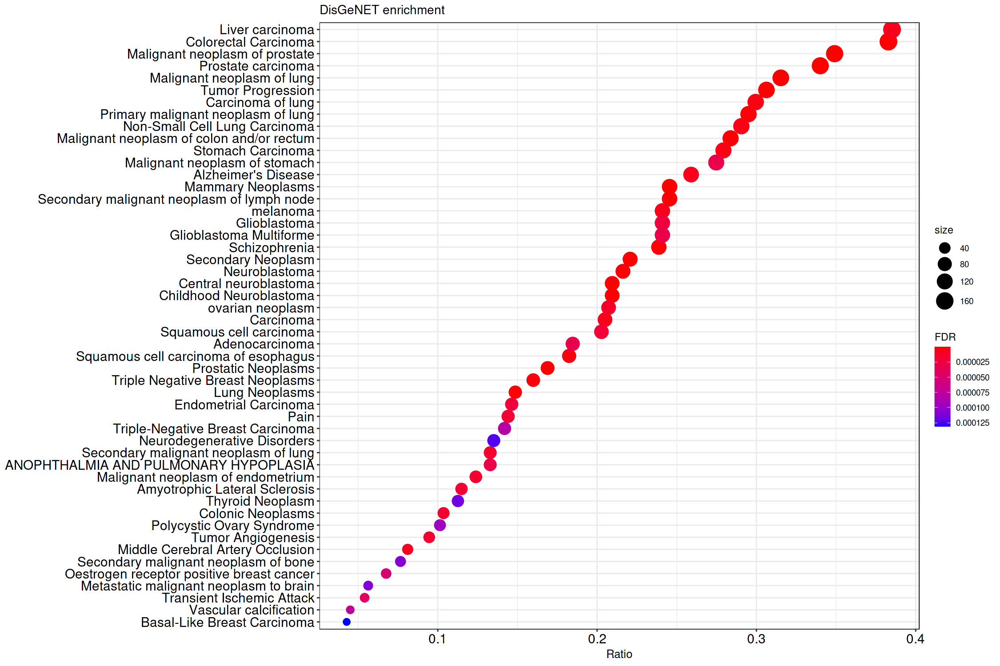

In [50]:
plot( res_enrich, class = "Enrichment",  cutoff= 0.05, nchars=70)

In [51]:
library(clusterProfiler)
library(DOSE)
library(enrichplot)
library(org.Hs.eg.db)



clusterProfiler v3.18.1  For help: https://guangchuangyu.github.io/software/clusterProfiler

If you use clusterProfiler in published research, please cite:
Guangchuang Yu, Li-Gen Wang, Yanyan Han, Qing-Yu He. clusterProfiler: an R package for comparing biological themes among gene clusters. OMICS: A Journal of Integrative Biology. 2012, 16(5):284-287.


Attaching package: ‘clusterProfiler’


The following object is masked from ‘package:IRanges’:

    slice


The following object is masked from ‘package:S4Vectors’:

    rename


The following object is masked from ‘package:stats’:

    filter


DOSE v3.16.0  For help: https://guangchuangyu.github.io/software/DOSE

If you use DOSE in published research, please cite:
Guangchuang Yu, Li-Gen Wang, Guang-Rong Yan, Qing-Yu He. DOSE: an R/Bioconductor package for Disease Ontology Semantic and Enrichment analysis. Bioinformatics 2015, 31(4):608-609


Loading required package: AnnotationDbi


Attaching package: ‘AnnotationDbi’


The following 

In [52]:
dim(finalres_24h[finalres_24h$FC > 0,])

[1] 8051    4

In [53]:
head(finalres_24h)

,PROBEID,FC,PVAL,ADJ.PVAL
,<chr>,<dbl>,<dbl>,<dbl>
COL3A1,COL3A1,-7.997434,0.000000e+00,0.000000e+00
DIO2,DIO2,-7.246867,0.000000e+00,0.000000e+00
MMP1,MMP1,4.005775,0.000000e+00,0.000000e+00
PLAT,PLAT,2.831641,3.115053e-295,1.296485e-291
SLC37A2,SLC37A2,3.906634,1.304723e-263,4.344207e-260
C1R,C1R,-4.136403,9.902672e-256,2.747661e-252


In [54]:
sel_df = finalres_24h[finalres_24h$FC > 0,]

nsamples=1000
geneList = head(sel_df$FC, n=nsamples)
names(geneList) = head(sel_df$PROBEID, n=nsamples)
names(geneList) = mapIds(org.Hs.eg.db, head(sel_df$PROBEID, n=nsamples), 'ENTREZID', 'SYMBOL')
geneList = geneList[!is.na(names(geneList))]

geneList = geneList[order(geneList, decreasing = TRUE)]
head(geneList)

'select()' returned 1:1 mapping between keys and columns



1953   387914     3791     3485    57643    22979 
6.309222 6.070111 5.971141 5.888195 5.359722 5.125400

In [128]:
sel_df_full = finalres_24h[finalres_24h$ADJ.PVAL < 0.05,]

geneList_full =sel_df_full$FC
names(geneList_full) = sel_df_full$PROBEID
names(geneList_full) = mapIds(org.Hs.eg.db, names(geneList_full), 'ENTREZID', 'SYMBOL')
geneList_full = geneList_full[!is.na(names(geneList_full))]

geneList_full = geneList_full[order(geneList_full, decreasing = TRUE)]
head(geneList_full)

'select()' returned 1:many mapping between keys and columns



9413     2167    63876     1953   387914     3791 
7.554625 6.686792 6.580183 6.309222 6.070111 5.971141

In [156]:
dgnGSE <- gseDGN(geneList,
              pvalueCutoff  = 0.5,
              pAdjustMethod = "BH")
dgnGSE <- setReadable(dgnGSE, 'org.Hs.eg.db')


preparing geneSet collections...

GSEA analysis...

Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“All values in the stats vector are greater than zero and scoreType is "std", maybe you should switch to scoreType = "pos".”
Warning message in fgseaMultilevel(...):
“There were 2 pathways for which P-values were not calculated properly due to unbalanced (positive and negative) gene-level statistic values. For such pathways pval, padj, NES, log2err are set to NA. You can try to increase the value of the argument nPermSimple (for example set it nPermSimple = 10000)”
leading edge analysis...

done...



In [161]:
head(dgnGSE@result)

,ID,Description,setSize,enrichmentScore,NES,pvalue,p.adjust,qvalues,rank,leading_edge,core_enrichment
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
C2938924,C2938924,Oestrogen receptor positive breast cancer,51,0.5099258,2.101373,1.310868e-05,0.02079037,0.01959403,171,"tags=43%, list=18%, signal=37%",KDR/LGR6/MMP1/FYN/GLI2/KLF5/FOSL1/STC2/GSN/CD24/CCND1/DNER/SLC20A1/UBASH3B/MAPT/ADAMTS2/RAB27B/EREG/E2F7/PAG1/EPHB2/MAP4K4
C0027796,C0027796,Neuralgia,52,0.5066280,2.092560,3.143279e-05,0.02492620,0.02349187,89,"tags=31%, list=9%, signal=30%",KDR/LGR6/SNAP25/DUSP6/CXCL1/GLI2/NEO1/SCN9A/PRKG1/KLF5/MCC/ODC1/ADORA1/TNFRSF1B/AKT3/ELAVL2
C0085762,C0085762,Alcohol abuse,11,0.7140544,2.062592,3.133658e-04,0.16566604,0.15613312,246,"tags=91%, list=26%, signal=68%",LGR6/MMP1/FYN/CCND1/AKT3/ARNTL/TLR2/CHRNA5/ARNTL2/FN1
C1654637,C1654637,androgen independent prostate cancer,21,0.6000278,2.077471,4.625796e-04,0.18341280,0.17285869,186,"tags=57%, list=20%, signal=47%",KDR/EGR1/GLI2/PMEPA1/FOSL1/CCND1/AKT3/EREG/TLR2/EPHB2/TNFRSF12A/BIRC3
C0001430,C0001430,Adenoma,92,0.3948748,1.737907,6.188434e-04,0.19629713,0.18500161,82,"tags=22%, list=9%, signal=22%",KDR/IGFBP2/NR2F1/SNAP25/MMP1/CXCL1/FYN/TLE4/PMEPA1/KLF5/FOSL1/MARCKSL1/MCC/ENC1/TGFA/ODC1/GSN/CD24/CABLES1/CCND1
C0026769,C0026769,Multiple Sclerosis,112,0.3785269,1.694234,8.563526e-04,0.20274661,0.19107996,311,"tags=47%, list=33%, signal=36%",KDR/LGR6/SNAP25/MMP1/CHGB/EGR1/CXCL1/FYN/PLXNA2/PLAT/SLC25A27/MCC/CYTIP/AMIGO2/TGFA/GSN/CD24/TNFRSF1B/CCND1/ELAVL2/MAPT/ARNTL/PTX3/TLR2/EPHB2/TNFRSF12A/ANPEP/UHRF1/BIRC3/BMPR2/TGFBR1/NT5E/NCOA5/SPRED2/PTGES/MT2A/TCF19/FN1/SERPINE1/PIK3R3/HSPA1B/ASF1B/ASAP2/ANTXR2/FGFR1/KLC1/SMAD7/ACTB/NFYA/CALM1/LAMC2/NXF1/DNAJC5


In [159]:
dgnGSE@result[dgnGSE@result$qvalues < 0.05,]

,ID,Description,setSize,enrichmentScore,NES,pvalue,p.adjust,qvalues,rank,leading_edge,core_enrichment
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
C2938924,C2938924,Oestrogen receptor positive breast cancer,51,0.5099258,2.101373,1.310868e-05,0.02079037,0.01959403,171,"tags=43%, list=18%, signal=37%",KDR/LGR6/MMP1/FYN/GLI2/KLF5/FOSL1/STC2/GSN/CD24/CCND1/DNER/SLC20A1/UBASH3B/MAPT/ADAMTS2/RAB27B/EREG/E2F7/PAG1/EPHB2/MAP4K4
C0027796,C0027796,Neuralgia,52,0.5066280,2.092560,3.143279e-05,0.02492620,0.02349187,89,"tags=31%, list=9%, signal=30%",KDR/LGR6/SNAP25/DUSP6/CXCL1/GLI2/NEO1/SCN9A/PRKG1/KLF5/MCC/ODC1/ADORA1/TNFRSF1B/AKT3/ELAVL2


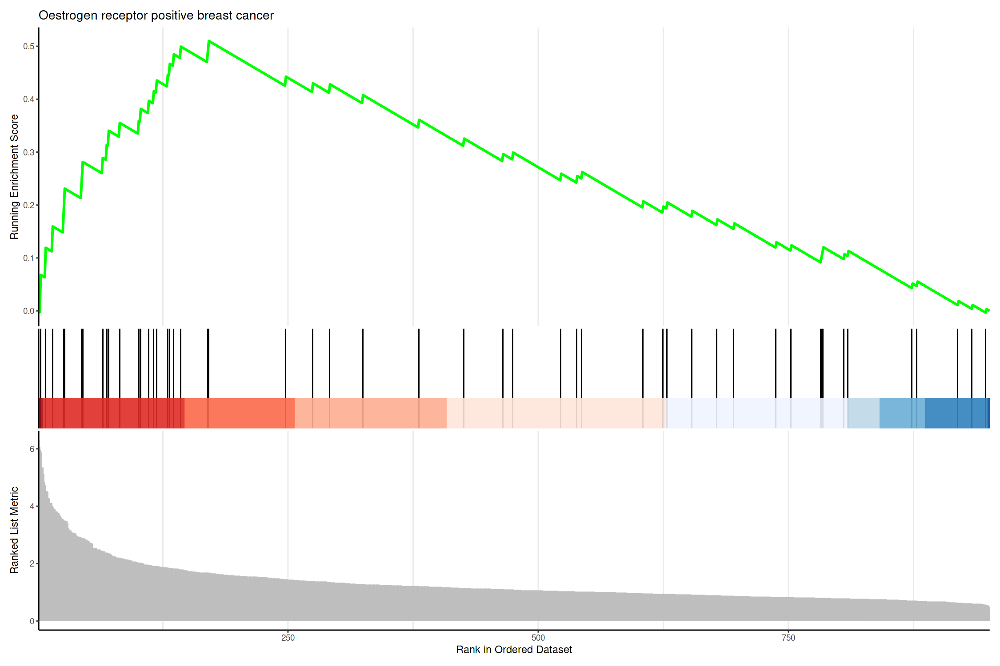

In [160]:
gseaplot2(dgnGSE, geneSetID = 1, title = dgnGSE$Description[1])

In [58]:
dgnEnrich <- enrichDGN(names(geneList),
              pvalueCutoff  = 0.5,
              pAdjustMethod = "BH")
dgnEnrich <- setReadable(dgnEnrich, 'org.Hs.eg.db')
head(dgnEnrich@result, n=20)

,ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<int>
C0016057,C0016057,Fibrosarcoma,53/924,413/21671,8.043105e-13,5.914095e-09,4.549011e-09,KDR/MMP1/EGR1/PLAT/ODC1/TNFRSF1B/CCND1/FBLN1/PTX3/EPHB2/ANPEP/ROR1/FN1/SERPINE1/SPRY2/TTL/HSPA1B/SDC2/CDKN1A/ACTB/FUS/RRM2/CAD/F3/PLAU/BCL2L1/HRAS/GPX4/EPHB4/RIPK1/MET/SLC26A2/CRK/EGFR/CLU/SLTM/MSH2/FLNA/ATR/PXN/KIF5B/ARF6/KHSRP/PSIP1/HSPA5/STAT1/HSPA4/TIMP2/TOP1/HK1/AKT1/CD44/TIMP1,53
C0278595,C0278595,Adult Fibrosarcoma,49/924,387/21671,9.777561e-12,3.594720e-08,2.764991e-08,KDR/MMP1/EGR1/PLAT/TNFRSF1B/CCND1/FBLN1/PTX3/EPHB2/ANPEP/ROR1/FN1/SERPINE1/SPRY2/TTL/HSPA1B/SDC2/CDKN1A/ACTB/FUS/RRM2/CAD/F3/PLAU/HRAS/GPX4/EPHB4/RIPK1/MET/CRK/EGFR/CLU/SLTM/MSH2/FLNA/PXN/KIF5B/ARF6/KHSRP/PSIP1/HSPA5/STAT1/HSPA4/TIMP2/TOP1/HK1/AKT1/CD44/TIMP1,49
C0024668,C0024668,"Mammary Neoplasms, Experimental",33/924,218/21671,2.436587e-10,5.454700e-07,4.195653e-07,KDR/DUSP6/TLE4/TGFA/STC2/GSN/CCND1/GDA/RB1/SLC12A2/FN1/ACTB/SLC25A10/CAD/PLAU/BCL2L1/KRT7/HRAS/TYMS/PDGFA/HNRNPAB/RXRA/PIK3R1/EGFR/ACTN4/SRSF2/EZR/TPM3/ACTG1/CCND3/YWHAZ/IL6ST/CD44,33
C0279628,C0279628,Adenocarcinoma Of Esophagus,52/924,468/21671,2.967333e-10,5.454700e-07,4.195653e-07,KDR/IGFBP2/MMP1/KLF5/ODC1/CD24/CCND1/TMOD1/FTH1/PAG1/TLR2/EPHB2/TNFRSF12A/PLCE1/UHRF1/BIRC3/KLF12/PTGES/FN1/MXD1/CDKN1A/ACTB/ROCK2/DNMT1/ETV1/KRT7/FOXM1/TYMS/IL18/CDH13/ITGA6/MET/AKR1C2/CDK9/MCL1/MYO9B/EGFR/C3/EIF4G1/ASPM/ATR/ARF6/SLC2A1/NQO1/HSPA4/AXL/GOLM1/YWHAZ/CALR/ITGA3/CD151/TIMP1,52
C0220650,C0220650,Metastatic malignant neoplasm to brain,46/924,392/21671,5.458314e-10,8.026997e-07,6.174215e-07,KDR/MMP1/EGR1/DUSP6/GLI2/TGFA/CD24/AKT3/ELAVL2/MAPT/SH3RF3/SPOCK1/PTX3/EPHB2/TNFRSF12A/EPHA2/CLSPN/FGFR1/KLC1/ACTB/LAMC2/DNMT1/ETV1/PKNOX1/CXADR/MTSS1/MET/S100A16/EGFR/ATG16L1/EML4/MSH2/PCDH7/CREB1/DAP/KIF5B/ACTN4/TPM3/CDH2/AXL/TPR/TOP1/CALR/AKT1/IL6ST/CD44,46
C4721414,C4721414,Mantle cell lymphoma,50/924,466/21671,2.165679e-09,2.412377e-06,1.855555e-06,IGF2BP3/GLI2/SORBS1/CCND1/PDE3B/DNER/PAG1/RB1/ROR1/PCNT/RANGAP1/CDKN1A/ACTB/CALM1/FUS/RAPH1/DNMT1/MELK/BCR/CTCF/MOB3A/KLF6/CXADR/PSMD2/CDC42BPA/RIPK1/CTTN/WEE1/CDK9/VCP/MCL1/EGFR/CDC6/MSH2/PDPK1/FOXO3/CDC20/ATR/XPO1/HSPA5/STAT1/NCL/HSPA4/CCND3/EIF4G2/CALR/TPX2/AKT1/IL6ST/CD44,50
C1960398,C1960398,HER2-positive carcinoma of breast,37/924,288/21671,2.296564e-09,2.412377e-06,1.855555e-06,CXCL1/CD24/CCND1/AKT3/SERTAD1/EPHB2/EPHA2/ROR1/ARNTL2/TFAP2C/SERPINE1/PIK3R3/FEN1/FGFR1/FOXM1/TYMS/MTSS1/EPHB4/MET/CD59/PTPN1/BAG1/MCL1/EGFR/CAPN2/EML4/PAK2/FOXO3/CDC37/ATR/PRKAA1/EZR/CUL3/STAT1/AXL/AKT1/CD44,37
C0858252,C0858252,Breast adenocarcinoma,31/924,219/21671,4.493534e-09,4.130120e-06,3.176811e-06,KDR/CADM1/EGR1/FNBP1L/SLC20A1/RB1/EPHA2/TJP1/ROR1/SERPINE1/FGFR1/CDKN1A/ACTB/RAPH1/MELK/HERC2/HRAS/IPO9/MCL1/CSRP1/CRK/EGFR/PBRM1/PDPK1/PXN/SLC2A1/NCL/NQO1/DHFR/TOP1/AKT1,31
C0280141,C0280141,Acute Undifferentiated Leukemia,22/924,119/21671,5.667384e-09,4.630253e-06,3.561504e-06,KDR/GLI2/PAG1/ANPEP/PCDH17/FN1/FGFR1/MEIS1/RUNX1/BCR/KRT7/FOXM1/SMC4/STIL/AHR/DEK/CREB1/PRKAA1/HSPA5/SET/AKT1/SYNCRIP,22


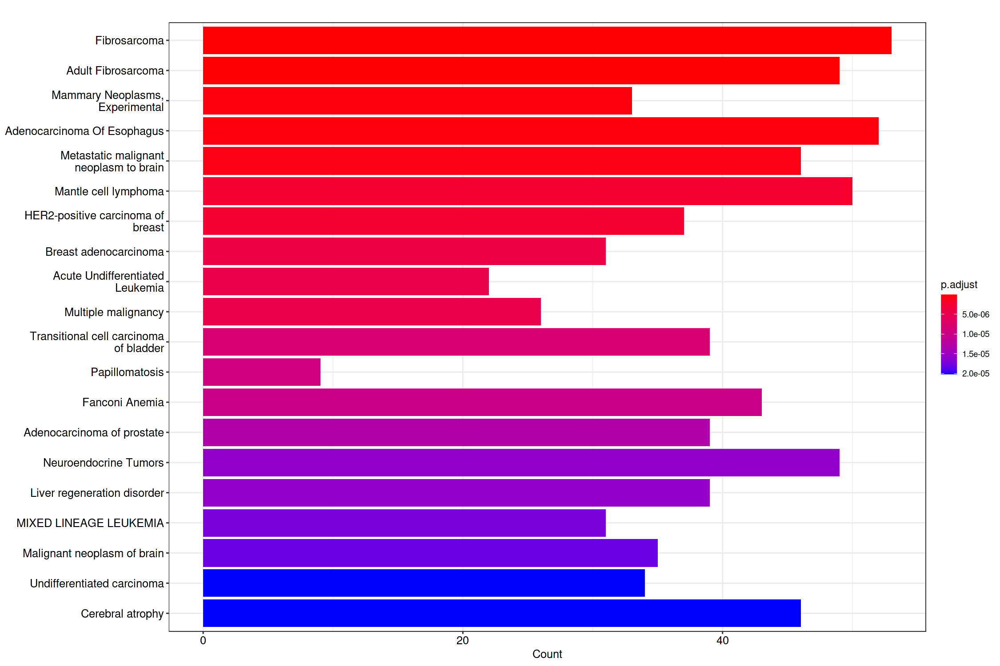

In [59]:
barplot(dgnEnrich, showCategory=20) 

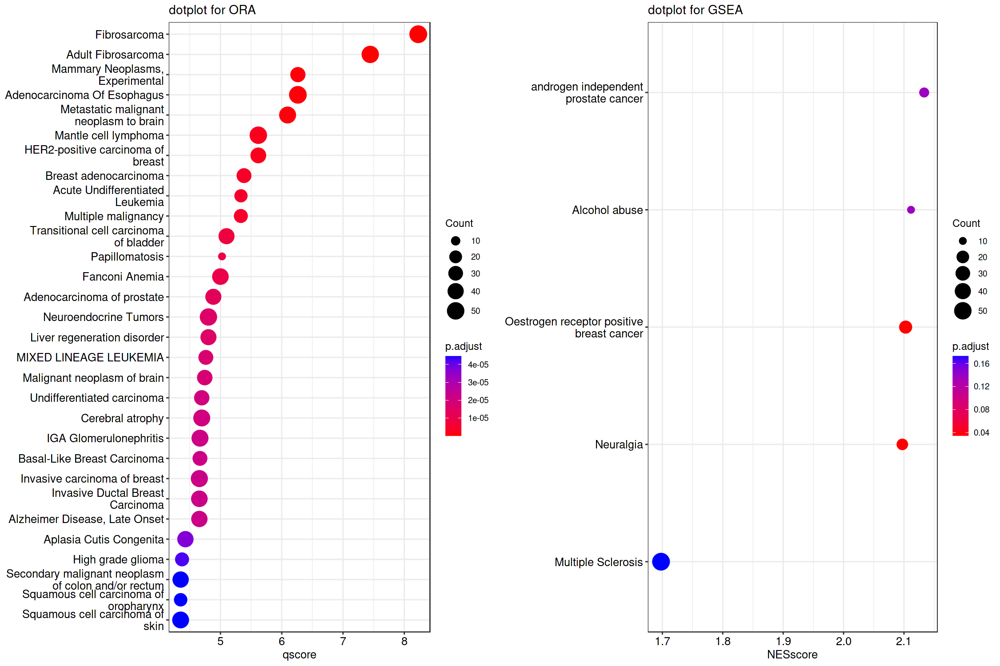

In [60]:
pE=mutate(dgnEnrich, qscore = -log(p.adjust, base=10)) %>%  dotplot( x="qscore", showCategory=30) + ggtitle("dotplot for ORA")
pG=mutate(dgnGSE, NESscore = NES) %>% filter(p.adjust < 0.2) %>% arrange(abs(NESscore)) %>%  dotplot( x="NESscore", showCategory=30) + ggtitle("dotplot for GSEA")

cowplot::plot_grid(pE, pG)

Warning message:
“ggrepel: 7 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


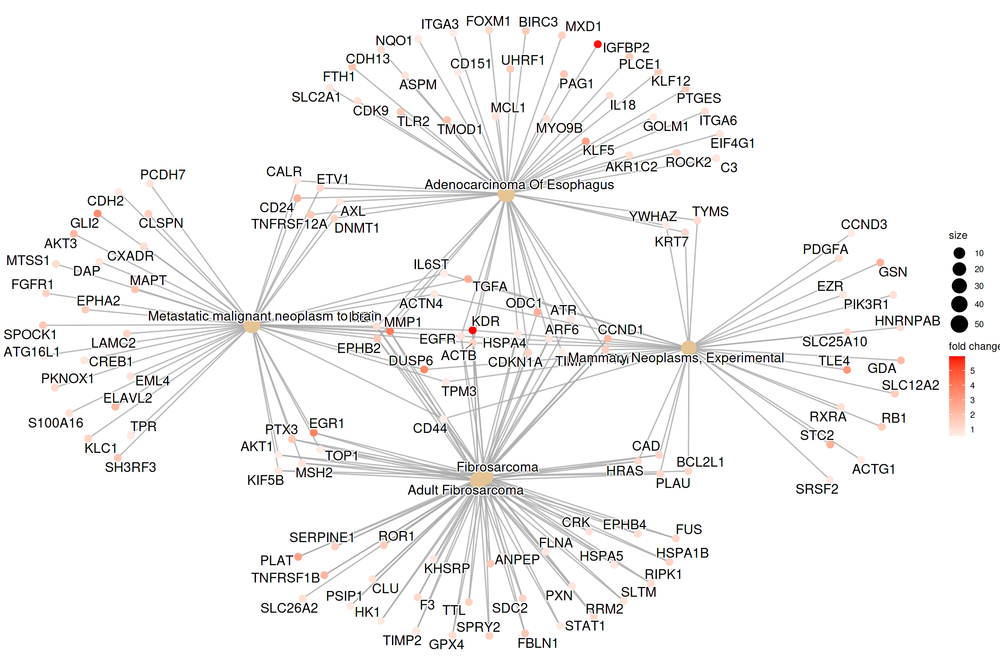

In [61]:
options(repr.plot.width = 15, repr.plot.height = 10, repr.plot.res = 150)

cnetplot(dgnEnrich, categorySize="geneNum", foldChange=geneList)

Warning message:
“Ignoring unknown parameters: align”


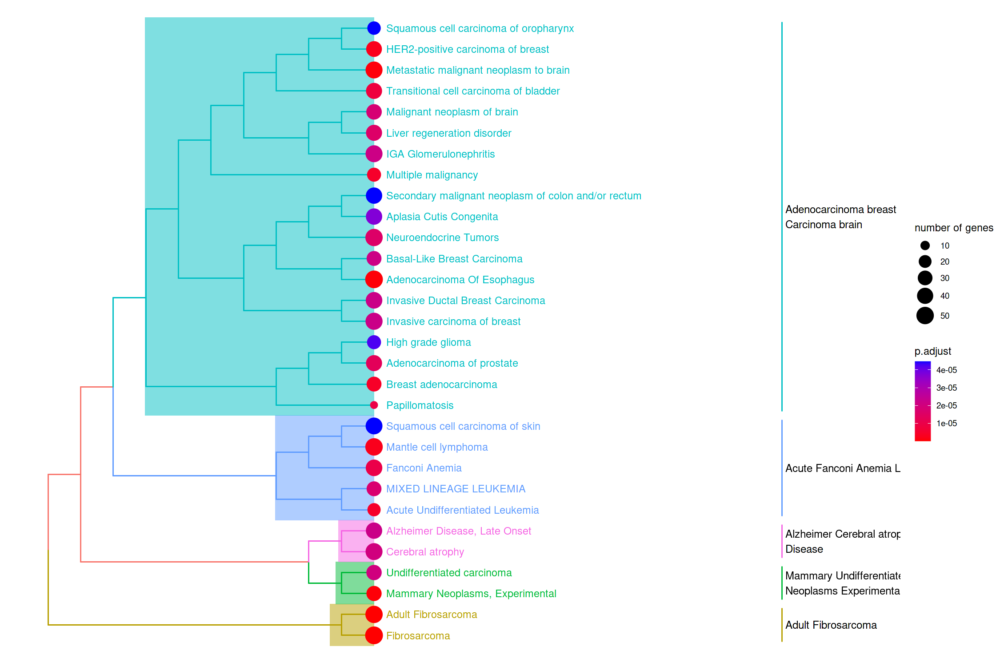

In [62]:
dgnEnrich2 <- pairwise_termsim(dgnEnrich)
treeplot(dgnEnrich2)